In [1]:
#import needed libraries
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, Polygon
import descartes
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_profiling as pp

%matplotlib inline

In [4]:
#reading csv data as pandas data frames
data_riders = pd.read_csv('Riders.csv')
data_test = pd.read_csv('Test.csv')
data_train = pd.read_csv('Train.csv')

In [5]:
#Getting some summary stats on the Train data
display(data_train.info(),data_train.sample(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21201 entries, 0 to 21200
Data columns (total 29 columns):
Order No                                     21201 non-null object
User Id                                      21201 non-null object
Vehicle Type                                 21201 non-null object
Platform Type                                21201 non-null int64
Personal or Business                         21201 non-null object
Placement - Day of Month                     21201 non-null int64
Placement - Weekday (Mo = 1)                 21201 non-null int64
Placement - Time                             21201 non-null object
Confirmation - Day of Month                  21201 non-null int64
Confirmation - Weekday (Mo = 1)              21201 non-null int64
Confirmation - Time                          21201 non-null object
Arrival at Pickup - Day of Month             21201 non-null int64
Arrival at Pickup - Weekday (Mo = 1)         21201 non-null int64
Arrival at Pickup - Time   

None

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Arrival at Destination - Time,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id,Time from Pickup to Arrival
17671,Order_No_26964,User_Id_3560,Bike,3,Business,22,5,2:03:02 PM,22,5,...,2:58:14 PM,8,27.4,NaN,-1.279395,36.825364,-1.276549,36.766981,Rider_Id_156,635
46,Order_No_14365,User_Id_3641,Bike,3,Business,26,2,2:22:29 PM,26,2,...,3:18:05 PM,8,NaN,NaN,-1.255189,36.782203,-1.299890,36.817921,Rider_Id_726,1519
13425,Order_No_11104,User_Id_1304,Bike,3,Business,25,5,2:55:15 PM,25,5,...,3:14:37 PM,3,23.5,NaN,-1.255362,36.789538,-1.260776,36.808002,Rider_Id_103,315
10876,Order_No_22496,User_Id_2066,Bike,3,Business,14,3,5:57:09 PM,14,3,...,7:00:43 PM,8,23.3,NaN,-1.327072,36.840637,-1.291700,36.880238,Rider_Id_554,2297
9322,Order_No_4256,User_Id_516,Bike,3,Business,14,1,10:36:39 AM,14,1,...,11:41:38 AM,20,23.4,NaN,-1.255189,36.782203,-1.319594,36.916170,Rider_Id_620,3253
21102,Order_No_11520,User_Id_3517,Bike,3,Business,8,3,3:18:59 PM,8,3,...,5:06:55 PM,9,NaN,NaN,-1.300921,36.828195,-1.299682,36.778252,Rider_Id_19,5850
13328,Order_No_20352,User_Id_136,Bike,3,Business,26,5,9:49:04 AM,26,5,...,10:56:16 AM,11,NaN,NaN,-1.296504,36.791304,-1.325452,36.721658,Rider_Id_559,2373
21075,Order_No_13389,User_Id_115,Bike,3,Business,14,5,4:23:44 PM,14,5,...,6:14:01 PM,21,21.7,NaN,-1.281854,36.824689,-1.277397,36.967868,Rider_Id_436,4472
19863,Order_No_536,User_Id_3766,Bike,2,Personal,20,5,3:02:48 PM,20,5,...,3:34:18 PM,4,20.6,NaN,-1.276553,36.829086,-1.267021,36.799448,Rider_Id_616,723
8232,Order_No_14256,User_Id_909,Bike,3,Business,10,3,1:33:55 PM,10,3,...,2:19:59 PM,8,30.7,NaN,-1.225322,36.808550,-1.267524,36.812715,Rider_Id_291,841


In [6]:
#Getting some summary stats on the Riders data
display(data_riders.info(),data_riders.sample(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960 entries, 0 to 959
Data columns (total 5 columns):
Rider Id          960 non-null object
No_Of_Orders      960 non-null int64
Age               960 non-null int64
Average_Rating    960 non-null float64
No_of_Ratings     960 non-null int64
dtypes: float64(1), int64(3), object(1)
memory usage: 37.6+ KB


None

,Rider Id,No_Of_Orders,Age,Average_Rating,No_of_Ratings
329,Rider_Id_722,350,768,12.6,81
864,Rider_Id_835,3001,2195,13.7,942
426,Rider_Id_731,483,645,13.5,31
331,Rider_Id_639,9,770,15.0,4
86,Rider_Id_153,233,982,13.9,85
66,Rider_Id_100,362,910,13.4,109
794,Rider_Id_132,104,302,9.8,9
168,Rider_Id_467,2699,2287,13.7,668
627,Rider_Id_454,81,491,14.7,19
441,Rider_Id_640,1975,1611,14.3,639


# Question 1
 • Set up a Zindi account (www.Zindi.Africa) and share with the TA’s and instructors. 
 You’ll submit your solutions to Zindi using the sample submission.
 
 Zindi account name :  NanaSekum

# Question 2
• Prepare a comprehensive exploratory data analysis (EDA) using the training dataset.   
• The EDA should include joining the different tables (train and riders), exploring the shape of the data,           checking correlation matrix, simple and complex plots like heat map and KDE, summary statistics etc.

In [6]:
# Overview of the Train data
report_train1=pp.ProfileReport(data_train)
report_train1

Following the warnings pesented by the overview,the timestamps that are recorded as strings are going to be pursed to pandas datetimes with pd.to_datetime()

In [7]:
#converting the strings to timestamps
#data_train[['Placement - Time','Arrival at Destination - Time']] = data_train[['Placement - Time','Arrival at Destination - Time']].apply(pd.to_datetime)

display(data_train.sample(5))

'''
Note: All fields with values been timestamps has the string 'Time' attached to the field name 
        so I changed the idea of pursing the string to a datetime in pandas into a loop.
'''
for times in data_train:
    if 'Time' in times:
        data_train[times]=pd.to_datetime(data_train[times])

report_train2 = pp.ProfileReport(data_train)        
display(report_train2)

,Order_No,User_Id,Vehicle_Type,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),...,Arrival_at_Destination_-_Time,Distance_(KM),Temperature,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Rider_Id,Time_from_Pickup_to_Arrival
6455,Order_No_10879,User_Id_2987,Bike,3,Business,28,1,3:56:37 PM,28,1,...,4:53:21 PM,10,22.6,NaN,-1.270212,36.821088,-1.301876,36.759086,Rider_Id_919,1107
2483,Order_No_13757,User_Id_416,Bike,1,Business,20,1,2:52:48 PM,20,1,...,3:22:12 PM,6,21.5,NaN,-1.284620,36.795832,-1.282491,36.821804,Rider_Id_241,670
6813,Order_No_11144,User_Id_2987,Bike,3,Business,17,4,4:36:01 PM,17,4,...,5:33:10 PM,15,21.9,NaN,-1.270212,36.821088,-1.292779,36.905349,Rider_Id_101,2772
15585,Order_No_767,User_Id_1244,Bike,3,Business,28,5,12:19:23 PM,28,5,...,1:59:52 PM,8,23.9,NaN,-1.272828,36.816608,-1.303596,36.778378,Rider_Id_511,4717
17619,Order_No_20067,User_Id_2811,Bike,1,Personal,25,2,10:55:05 AM,25,2,...,11:40:34 AM,4,23.8,NaN,-1.284838,36.802762,-1.284879,36.824597,Rider_Id_79,731


In [27]:
#looking out for common fields to use as key in joining the two data sets
display(data_riders.columns,data_train.columns)

Index(['Rider Id', 'No_Of_Orders', 'Age', 'Average_Rating', 'No_of_Ratings'], dtype='object')

Index(['Order No', 'User Id', 'Vehicle Type', 'Platform Type',
       'Personal or Business', 'Placement - Day of Month',
       'Placement - Weekday (Mo = 1)', 'Placement - Time',
       'Confirmation - Day of Month', 'Confirmation - Weekday (Mo = 1)',
       'Confirmation - Time', 'Arrival at Pickup - Day of Month',
       'Arrival at Pickup - Weekday (Mo = 1)', 'Arrival at Pickup - Time',
       'Pickup - Day of Month', 'Pickup - Weekday (Mo = 1)', 'Pickup - Time',
       'Arrival at Destination - Day of Month',
       'Arrival at Destination - Weekday (Mo = 1)',
       'Arrival at Destination - Time', 'Distance (KM)', 'Temperature',
       'Precipitation in millimeters', 'Pickup Lat', 'Pickup Long',
       'Destination Lat', 'Destination Long', 'Rider Id',
       'Time from Pickup to Arrival'],
      dtype='object')

In [7]:
# with the possibility of oversigths just looking through for common fields seems not to be a good option. 
# so I check out the common fields as
for field in data_riders.columns:
    if field in data_train.columns:
        print(field)

Rider Id


In [9]:
# The common field 'Rider Id' is going to used as key for joining the two data
data_train_riders = pd.merge(data_train,data_riders, on = 'Rider Id')
for times in data_train_riders:
    if 'Time' in times:
        data_train_riders[times]=pd.to_datetime(data_train_riders[times])
data_train_riders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21201 entries, 0 to 21200
Data columns (total 33 columns):
Order No                                     21201 non-null object
User Id                                      21201 non-null object
Vehicle Type                                 21201 non-null object
Platform Type                                21201 non-null int64
Personal or Business                         21201 non-null object
Placement - Day of Month                     21201 non-null int64
Placement - Weekday (Mo = 1)                 21201 non-null int64
Placement - Time                             21201 non-null datetime64[ns]
Confirmation - Day of Month                  21201 non-null int64
Confirmation - Weekday (Mo = 1)              21201 non-null int64
Confirmation - Time                          21201 non-null datetime64[ns]
Arrival at Pickup - Day of Month             21201 non-null int64
Arrival at Pickup - Weekday (Mo = 1)         21201 non-null int64
Arrival at 

In [10]:
data_train_riders.shape

(21201, 33)

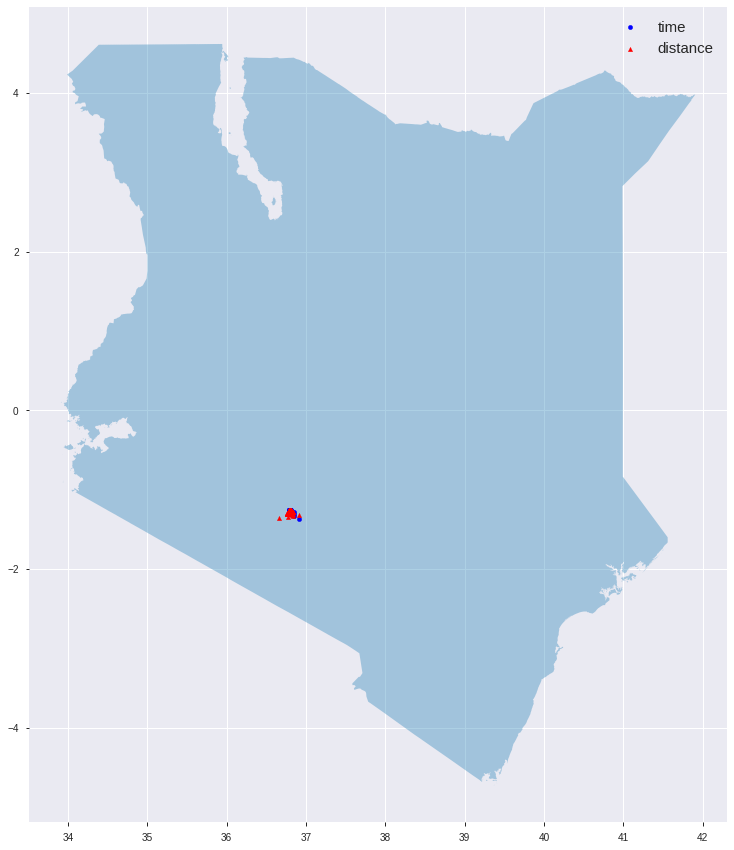

In [12]:
street_map = gpd.read_file('Kenya07.shp')
fig,ax = plt.subplots(figsize = (15,15))
street_map.plot(ax=ax,alpha = 0.4)
crs = {'int': 'epsg:4326'}
geometry = [Point(xy) for xy in zip(data_train["Pickup Long"],data_train["Pickup Lat"])]
geo_df = gpd.GeoDataFrame(data_train, #specifying the data
                                 crs=crs, #specifying the cordinate refernce system
                                 geometry =geometry) #specifying the geometry list created
geo_df[geo_df['Time from Pickup to Arrival'] == 1].plot(ax=ax, markersize = 20, color = 'blue', marker = 'o',label ='time')
geo_df[geo_df['Distance (KM)'] == 1].plot(ax=ax, markersize = 20, color = 'red', marker = '^',label = 'distance')
plt.legend(prop={'size': 15})

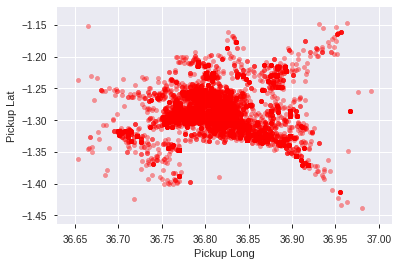

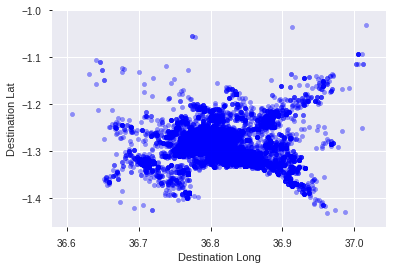

In [13]:
train_df = data_train
data_train.plot(kind="scatter", x="Pickup Long", y="Pickup Lat", alpha=0.4, color = 'red')
data_train.plot(kind="scatter", x="Destination Long", y="Destination Lat", alpha=0.4, color='blue')

plt.show()